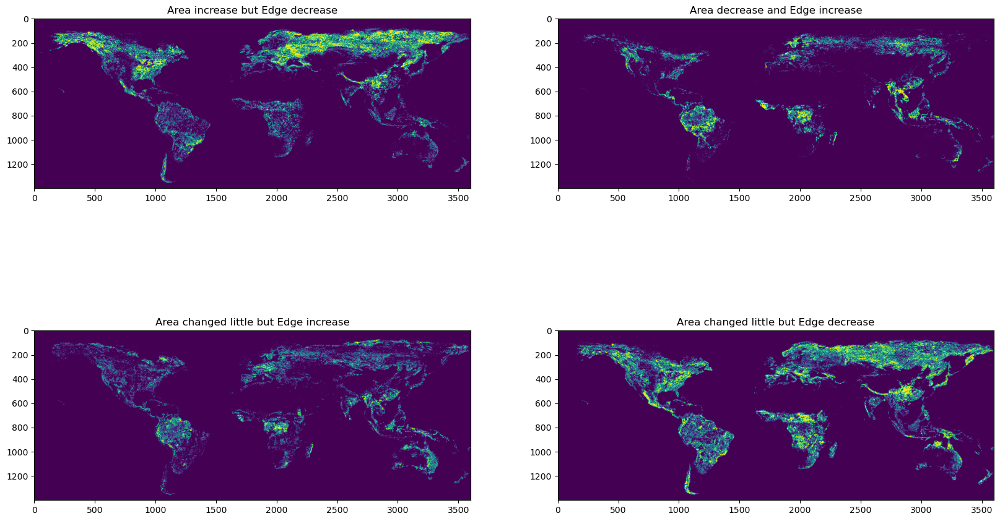

In [7]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt

# 读取tif文件
def read_tif(file):
    with rasterio.open(file) as src:
        return src.read(1)

# 设置文件路径
base_dir = r"H:\Global_tree_cover\TIFoutput\01\whole map"

area_2000 = read_tif(base_dir + "\\2000Area.tif")
area_2020 = read_tif(base_dir + "\\2020Area.tif")
edge_2000 = read_tif(base_dir + "\\2000Edge.tif")
edge_2020 = read_tif(base_dir + "\\2020Edge.tif")

# 计算变化
area_diff = area_2020 - area_2000
edge_diff = edge_2020 - edge_2000

# 定义条件
cond1 = np.logical_and(area_diff > 0, edge_diff < 0)  # forest area增加且forest edge减少
cond2 = np.logical_and(area_diff < 0, edge_diff > 0)  # forest area减少且forest edge增加
cond3 = np.logical_and(np.abs(area_diff) < 0.05*area_2000, edge_diff > 0)  # forest area没怎么变，但是edge增加了
cond4 = np.logical_and(np.abs(area_diff) < 0.05*area_2000, edge_diff < 0)  # forest area没怎么变，但是edge减少了

# 找到满足条件的地方，赋值为True
result1 = np.where(cond1, True, False)
result2 = np.where(cond2, True, False)
result3 = np.where(cond3, True, False)
result4 = np.where(cond4, True, False)

# 创建子图
fig, axs = plt.subplots(2, 2, figsize=(20, 12))

# 绘制图像
axs[0,0].imshow(result1)
axs[0,0].set_title('Area increase but Edge decrease')

axs[0,1].imshow(result2)
axs[0,1].set_title('Area decrease and Edge increase')

axs[1,0].imshow(result3)
axs[1,0].set_title('Area changed little but Edge increase')

axs[1,1].imshow(result4)
axs[1,1].set_title('Area changed little but Edge decrease')
# 展示图像
plt.show()


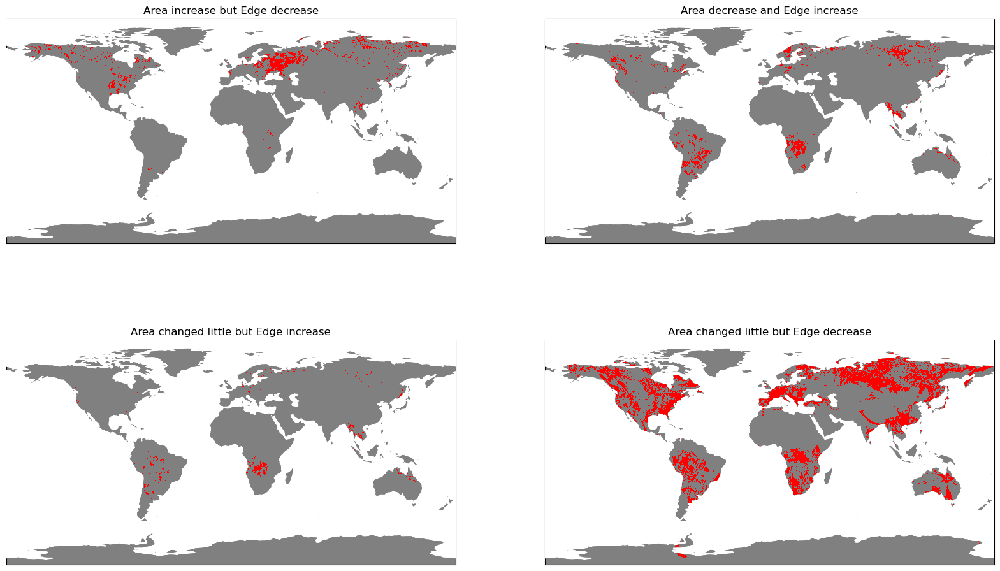

In [23]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import LinearSegmentedColormap

# 读取tif文件
def read_tif(file):
    with rasterio.open(file) as src:
        return src.read(1)

# 设置文件路径
base_dir = r"H:\Global_tree_cover\TIFoutput\01\whole map"

area_2000 = read_tif(base_dir + "\\2000Area.tif")
area_2020 = read_tif(base_dir + "\\2020Area.tif")
edge_2000 = read_tif(base_dir + "\\2000Edge.tif")
edge_2020 = read_tif(base_dir + "\\2020Edge.tif")

# 计算变化
area_diff = area_2020 - area_2000
edge_diff = edge_2020 - edge_2000

# 定义条件
cond1 = np.logical_and(area_diff > 0.05*area_2000, edge_diff < 0.05*edge_2000)  # forest area增加且forest edge减少
cond2 = np.logical_and(area_diff < 0.05*area_2000, edge_diff > 0.05*edge_2000)  # forest area减少且forest edge增加
cond3 = np.logical_and(np.abs(area_diff) < 0.05*area_2000, edge_diff > 0.05*edge_2000)  # forest area没怎么变，但是edge增加了
cond4 = np.logical_and(np.abs(area_diff) < 0.05*area_2000, edge_diff < 0.05*edge_2000)  # forest area没怎么变，但是edge减少了
forest_mask = np.where(np.logical_or(area_2000 > 0, area_2020 > 0), 1, np.nan)

# 找到满足条件的地方，赋值为True
result1 = np.where(cond1, True, False)
result2 = np.where(cond2, True, False)
result3 = np.where(cond3, True, False)
result4 = np.where(cond4, True, False)

# 设置投影
projection = ccrs.PlateCarree()

from matplotlib.colors import ListedColormap

# 创建一个从红色到蓝色的渐变 colormap
cmap = LinearSegmentedColormap.from_list(
    "my_colormap", ["gray", "red"], N=2
)

# 将结果矩阵转换为整数，用于 colormap
result1_int = result1.astype(int)
result2_int = result2.astype(int)
result3_int = result3.astype(int)
result4_int = result4.astype(int)

fig, axs = plt.subplots(2, 2, figsize=(20, 12), subplot_kw={'projection': projection})

# 绘制图像
for ax, result, title in zip(axs.ravel(), [result1_int, result2_int, result3_int, result4_int], 
                             ['Area increase but Edge decrease', 
                              'Area decrease and Edge increase', 
                              'Area changed little but Edge increase',
                              'Area changed little but Edge decrease']):
    img = ax.imshow(result, cmap=cmap, transform=ccrs.PlateCarree(), extent=[-180, 180, -90, 90])  # 假设数据的范围是全球
    ax.add_feature(cfeature.OCEAN, zorder=100, color='white')  # 使用白色覆盖海洋
    ax.add_feature(cfeature.COASTLINE)  # 添加海岸线
    ax.set_title(title)

plt.show()

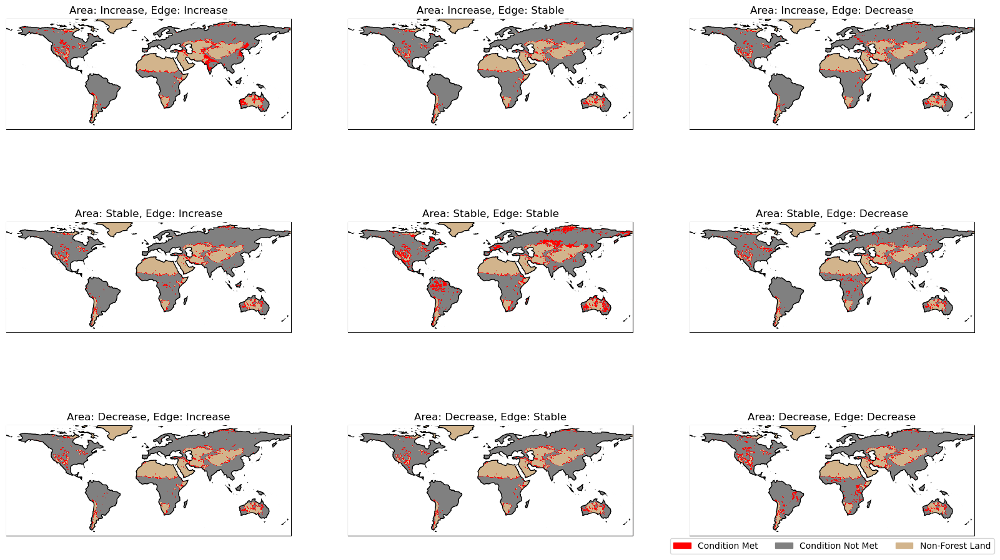

In [111]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.patches as mpatches

# 读取tif文件
def read_tif(file):
    with rasterio.open(file) as src:
        return src.read(1)

# 设置文件路径
base_dir = r"H:\Global_tree_cover\TIFoutput\01\whole map"

area_2000 = read_tif(base_dir + "\\2000Area.tif")
area_2020 = read_tif(base_dir + "\\2020Area.tif")
edge_2000 = read_tif(base_dir + "\\2000Edge.tif")
edge_2020 = read_tif(base_dir + "\\2020Edge.tif")

# 计算变化
area_diff = area_2020 - area_2000
edge_diff = edge_2020 - edge_2000

# 定义条件
thresh = 0.05  # 可以调整此阈值以控制"变化不大"的含义
cond_area_inc = area_diff > thresh*area_2000  # area增加
cond_area_dec = area_diff < -thresh*area_2000  # area减少
cond_area_stable = np.abs(area_diff) <= thresh*area_2000  # area变化不大
cond_edge_inc = edge_diff > thresh*edge_2000  # edge增加
cond_edge_dec = edge_diff < -thresh*edge_2000  # edge减少
cond_edge_stable = np.abs(edge_diff) <= thresh*edge_2000  # edge变化不大

forest_mask = np.where(np.logical_or(area_2000 > 0, area_2020 > 0), 1, np.nan)
non_forest_mask = np.where(np.isnan(forest_mask), 2, 0)

results = []
titles = []
# 九种情况
for cond_area in [cond_area_inc, cond_area_stable, cond_area_dec]:
    for cond_edge in [cond_edge_inc, cond_edge_stable, cond_edge_dec]:
        result = np.where(np.logical_and(cond_area, cond_edge), 1, 0)
        result = result * forest_mask
        result = np.nan_to_num(result) + non_forest_mask
        results.append(result)
        titles.append("Area: {}, Edge: {}".format(
            "Increase" if cond_area is cond_area_inc else ("Stable" if cond_area is cond_area_stable else "Decrease"),
            "Increase" if cond_edge is cond_edge_inc else ("Stable" if cond_edge is cond_edge_stable else "Decrease")))

# 设置投影
projection = ccrs.PlateCarree()

# 创建一个colormap
cmap = LinearSegmentedColormap.from_list(
    "my_colormap", ["gray", "red", "#D2B48C"], N=3
)


fig, axs = plt.subplots(3, 3, figsize=(20, 12), subplot_kw={'projection': projection},dpi=100)

# 自定义颜色标记
red_patch = mpatches.Patch(color='red', label='Condition Met')
gray_patch = mpatches.Patch(color='gray', label='Condition Not Met')
tan_patch = mpatches.Patch(color='tan', label='Non-Forest Land')

# 绘制图像
for ax, result, title in zip(axs.ravel(), results, titles):
    img = ax.imshow(result, cmap=cmap, transform=ccrs.PlateCarree(), extent=[-180, 180, -60, 80])
    ax.add_feature(cfeature.OCEAN, zorder=100, color='white')  # 使用白色覆盖海洋
    ax.add_feature(cfeature.COASTLINE, edgecolor='black',linewidth=3)  # 添加黑色海岸线以便于观察
    ax.set_title(title)

# 添加颜色标记说明
plt.legend(handles=[red_patch, gray_patch, tan_patch], loc='lower center', bbox_to_anchor=(0.5, -0.2), ncol=3, fancybox=True)

plt.show()

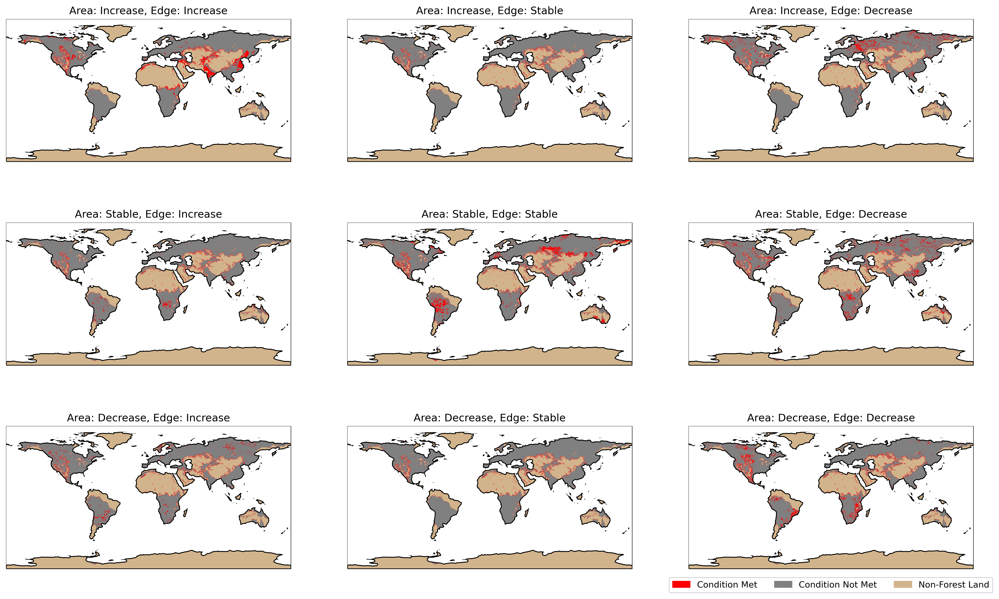

In [35]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.patches as mpatches

# 读取tif文件
def read_tif(file):
    with rasterio.open(file) as src:
        return src.read(1)

# 设置文件路径
base_dir = r"H:\Global_tree_cover\TIFoutput\01\whole map"

area_2000 = read_tif(base_dir + "\\2000Area.tif")
area_2020 = read_tif(base_dir + "\\2020Area.tif")
edge_2000 = read_tif(base_dir + "\\2000Edge.tif")
edge_2020 = read_tif(base_dir + "\\2020Edge.tif")

# 计算变化
area_diff = area_2020 - area_2000
edge_diff = edge_2020 - edge_2000

# 定义条件
thresh = 0.03  # 可以调整此阈值以控制"变化不大"的含义
cond_area_inc = area_diff > thresh*area_2000  # area增加
cond_area_dec = area_diff < -thresh*area_2000  # area减少
cond_area_stable = np.abs(area_diff) <= thresh*area_2000  # area变化不大
cond_edge_inc = edge_diff > thresh*edge_2000  # edge增加
cond_edge_dec = edge_diff < -thresh*edge_2000  # edge减少
cond_edge_stable = np.abs(edge_diff) <= thresh*edge_2000  # edge变化不大

forest_mask = np.where(np.logical_or(area_2000 > 0, area_2020 > 0), 1, np.nan)
non_forest_mask = np.where(np.isnan(forest_mask), 2, 0)

results = []
titles = []
# 九种情况
for cond_area in [cond_area_inc, cond_area_stable, cond_area_dec]:
    for cond_edge in [cond_edge_inc, cond_edge_stable, cond_edge_dec]:
        result = np.where(np.logical_and(cond_area, cond_edge), 1, 0)
        result = result * forest_mask
        result = np.nan_to_num(result) + non_forest_mask
        results.append(result)
        titles.append("Area: {}, Edge: {}".format(
            "Increase" if cond_area is cond_area_inc else ("Stable" if cond_area is cond_area_stable else "Decrease"),
            "Increase" if cond_edge is cond_edge_inc else ("Stable" if cond_edge is cond_edge_stable else "Decrease")))

# 设置投影
projection = ccrs.PlateCarree()

# 创建一个colormap
cmap = LinearSegmentedColormap.from_list(
    "my_colormap", ["gray", "red", "#D2B48C"], N=3
)


fig, axs = plt.subplots(3, 3, figsize=(20, 12), subplot_kw={'projection': projection},dpi=300)

# 自定义颜色标记
red_patch = mpatches.Patch(color='red', label='Condition Met')
gray_patch = mpatches.Patch(color='gray', label='Condition Not Met')
tan_patch = mpatches.Patch(color='tan', label='Non-Forest Land')

# 绘制图像
for ax, result, title in zip(axs.ravel(), results, titles):
    img = ax.imshow(result, cmap=cmap, transform=ccrs.PlateCarree(), extent=[-180, 180, -90, 90])  # 假设数据的范围是全球
    ax.add_feature(cfeature.OCEAN, zorder=100, color='white')  # 使用白色覆盖海洋
    ax.add_feature(cfeature.COASTLINE, edgecolor='black',linewidth=3)  # 添加黑色海岸线以便于观察
    ax.set_title(title)

# 添加颜色标记说明
plt.legend(handles=[red_patch, gray_patch, tan_patch], loc='lower center', bbox_to_anchor=(0.5, -0.2), ncol=3, fancybox=True)

plt.show()

In [40]:
import rasterio
from rasterio.transform import Affine
import os

# 创建结果保存的文件夹
output_dir = "H:/Global_tree_cover/TIFoutput/results"
os.makedirs(output_dir, exist_ok=True)

# 使用area_2000作为参考数据集获取元数据信息
reference_dataset = rasterio.open(base_dir + "\\2000Area.tif")
meta = reference_dataset.meta

# 遍历结果并保存为GeoTIFF
for result, title in zip(results, titles):
    # 构造保存文件路径
    file_name = (title.replace(" ", "")).replace(":", "").replace(",", "_") + ".tif"
    output_file = os.path.join(output_dir, file_name)

    # 更新元数据信息
    meta.update(count=1, dtype=rasterio.float32)

    # 创建新的数据集
    with rasterio.open(output_file, 'w', **meta) as dst:
        # 将结果数据写入新的数据集
        dst.write(result.astype(rasterio.float32), 1)


In [117]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.patches as mpatches

# 读取tif文件
def read_tif(file):
    with rasterio.open(file) as src:
        return src.read(1)

# 设置文件路径
base_dir = r"H:\Global_tree_cover\TIFoutput\01\whole map"

area_2000 = read_tif(base_dir + "\\2000Area.tif")
area_2020 = read_tif(base_dir + "\\2020Area.tif")
edge_2000 = read_tif(base_dir + "\\2000Edge.tif")
edge_2020 = read_tif(base_dir + "\\2020Edge.tif")

# 计算变化
area_diff = area_2020 - area_2000
edge_diff = edge_2020 - edge_2000

# 定义条件
thresh = 0.05  # 可以调整此阈值以控制"变化不大"的含义
cond_area_inc = area_diff > thresh*area_2000  # area增加
cond_area_dec = area_diff < -thresh*area_2000  # area减少
cond_area_stable = np.abs(area_diff) <= thresh*area_2000  # area变化不大
cond_edge_inc = edge_diff > thresh*edge_2000  # edge增加
cond_edge_dec = edge_diff < -thresh*edge_2000  # edge减少
cond_edge_stable = np.abs(edge_diff) <= thresh*edge_2000  # edge变化不大

forest_mask = np.where(np.logical_or(area_2000 > 0, area_2020 > 0), 1, np.nan)
non_forest_mask = np.where(np.isnan(forest_mask), 3, 0)

# 读取温度数据
temp_trend = read_tif(r"H:\Global_tree_cover\Temperature\trend_map_00_20.tif")

binary_trend_map = np.where(temp_trend > 0, 1, np.where(temp_trend == 0, 0, 2))

results = []
titles = []
# 九种情况
for cond_area in [cond_area_inc, cond_area_stable, cond_area_dec]:
    for cond_edge in [cond_edge_inc, cond_edge_stable, cond_edge_dec]:
        result = np.where(np.logical_and(cond_area, cond_edge), 1, 0)
        result = result * forest_mask
        result = np.nan_to_num(result) + non_forest_mask
        result = np.where(result==1, binary_trend_map, result)
        results.append(result)
        titles.append("Area: {}, Edge: {}".format(
            "Increase" if cond_area is cond_area_inc else ("Stable" if cond_area is cond_area_stable else "Decrease"),
            "Increase" if cond_edge is cond_edge_inc else ("Stable" if cond_edge is cond_edge_stable else "Decrease")))

# 设置投影
projection = ccrs.PlateCarree()

# 创建一个colormap
cmap = LinearSegmentedColormap.from_list(
    "my_colormap", ["#ABA9BB", "red","blue","tan"], N=4
)

# 自定义颜色标记
blue_patch = mpatches.Patch(color="#4682B4", label="Condition Met (Temp decrease)")
red_patch = mpatches.Patch(color="red", label="Condition Met (Temp increase)")
gray_patch = mpatches.Patch(color="#ABA9BB", label="Condition Not Met (Non-Forest Land)")
tan_patch = mpatches.Patch(color="tan", label="Non-Forest Land")

fig, axs = plt.subplots(3, 3, figsize=(40, 16), subplot_kw={'projection': projection}, dpi=400)

# 定义饼图的相对位置
pie_x = 0.0025  # 饼图的 x 坐标
pie_y = 0.008  # 饼图的 y 坐标

# 绘制图像和饼图
for i, (ax, result, title) in enumerate(zip(axs.ravel(), results, titles)):
    img = ax.imshow(result, cmap=cmap, transform=ccrs.PlateCarree(), extent=[-180, 180, -60, 80])
    ax.add_feature(cfeature.OCEAN, zorder=100, color='white')
    ax.add_feature(cfeature.COASTLINE, edgecolor='black', linewidth=3)
    ax.set_title(title, fontdict={'size': 30})

    # 统计增加和减少的像素数量
    increase_pixels = np.sum(result == 1)
    decrease_pixels = np.sum(result == 2)

    # 添加饼图子图
    pie_width = 0.06  # 饼图的宽度
    pie_height = 0.06  # 饼图的高度
    pie_margin = 0.1  # 饼图与子图之间的间距

    # 计算饼图位置
    pie_ax = fig.add_axes([ax.get_position().x0 + pie_x, ax.get_position().y0 + pie_y, pie_width, pie_height])

    sizes = [increase_pixels, decrease_pixels]
    colors = ['red', '#4682B4']
    pie_ax.pie(sizes, colors=colors, autopct='%.0f%%', startangle=90)
    pie_ax.axis('equal')  # 设置饼图为圆形


# 添加颜色标记说明
plt.legend(handles=[gray_patch, red_patch, blue_patch, tan_patch], loc='lower center', bbox_to_anchor=(-1.7, -1.2), ncol=4, fancybox=True, prop={'size': 25})

plt.savefig('H:/Global_tree_cover/Compare5%.tif', dpi=400, format='tiff')
#plt.show()

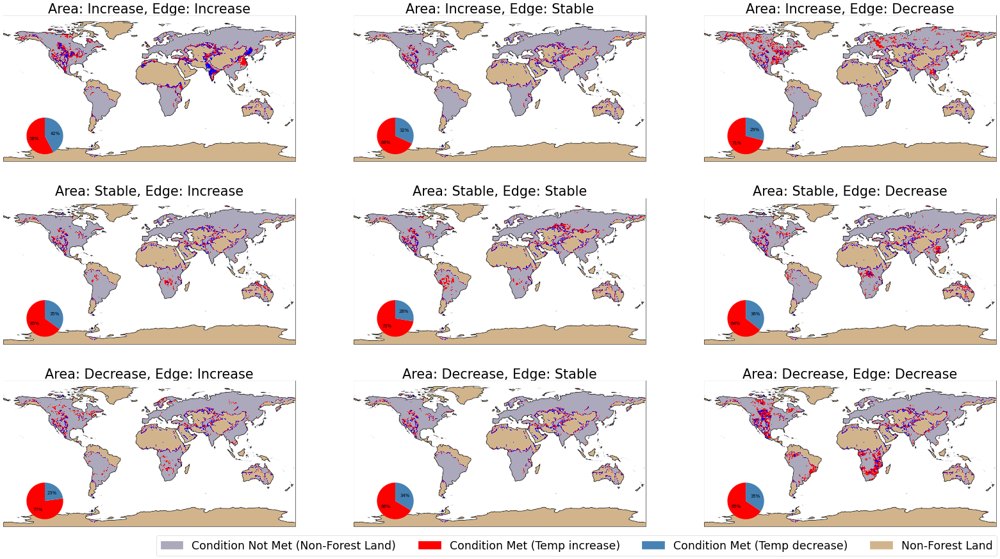

In [100]:
fig, axs = plt.subplots(3, 3, figsize=(40, 21), subplot_kw={'projection': projection}, dpi=1000)

# 定义饼图的相对位置
pie_x = 0.0025  # 饼图的 x 坐标
pie_y = 0.008  # 饼图的 y 坐标

# 绘制图像和饼图
for i, (ax, result, title) in enumerate(zip(axs.ravel(), results, titles)):
    img = ax.imshow(result, cmap=cmap, transform=ccrs.PlateCarree(), extent=[-180, 180, -90, 90])
    ax.add_feature(cfeature.OCEAN, zorder=100, color='white')
    ax.add_feature(cfeature.COASTLINE, edgecolor='black', linewidth=3)
    ax.set_title(title, fontdict={'size': 30})

    # 统计增加和减少的像素数量
    increase_pixels = np.sum(result == 1)
    decrease_pixels = np.sum(result == 2)

    # 添加饼图子图
    pie_width = 0.06  # 饼图的宽度
    pie_height = 0.06  # 饼图的高度
    pie_margin = 0.1  # 饼图与子图之间的间距

    # 计算饼图位置
    pie_ax = fig.add_axes([ax.get_position().x0 + pie_x, ax.get_position().y0 + pie_y, pie_width, pie_height])

    sizes = [increase_pixels, decrease_pixels]
    colors = ['red', '#4682B4']
    pie_ax.pie(sizes, colors=colors, autopct='%.0f%%', startangle=90)
    pie_ax.axis('equal')  # 设置饼图为圆形


# 添加颜色标记说明
plt.legend(handles=[gray_patch, red_patch, blue_patch, tan_patch], loc='lower center', bbox_to_anchor=(-1.7, -1), ncol=4, fancybox=True, prop={'size': 25})

plt.show()
plt.savefig('H:/Global_tree_cover/Compare05.tif', dpi=1000, format='tiff')

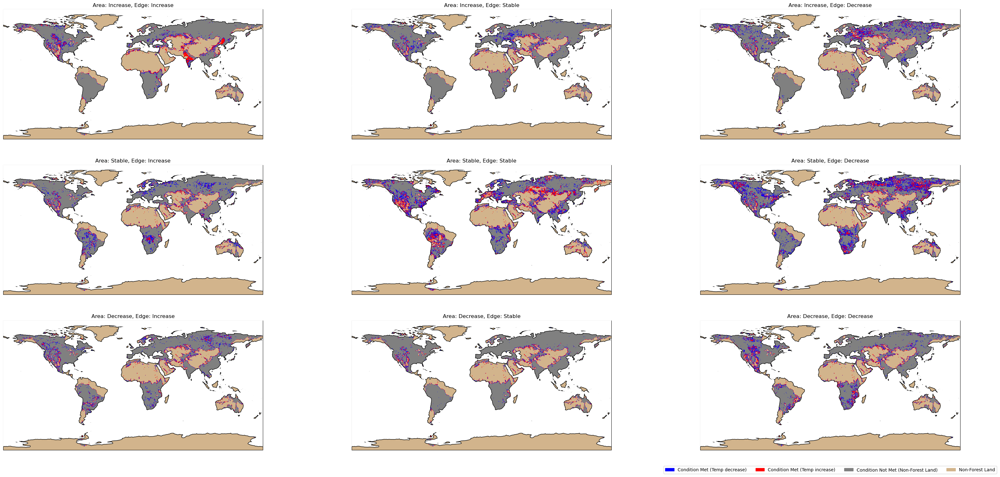

In [4]:
import rasterio

# 设置保存路径和文件名
output_file = 'H:/Global_tree_cover/Compare05.tif'

# 获取第一个输入文件的元数据信息
meta = first_file.meta

# 更新元数据信息
meta.update(count=1, dtype=rasterio.float32)

# 创建新的数据集
with rasterio.open(output_file, 'w', **meta) as dst:
    # 将结果数据写入新的数据集
    dst.write(result.astype(rasterio.float32), 1)

In [53]:
modified_results_flat = np.concatenate(modified_results).flatten()

unique_values, counts = np.unique(modified_results_flat, return_counts=True)
total_elements = len(modified_results_flat)

for value, count in zip(unique_values, counts):
    percentage = count / total_elements * 100
    print(f"Value: {value}, Percentage: {percentage}%")

Value: 0.0, Percentage: 19.45042328042328%
Value: 8.0, Percentage: 2.43130291005291%
Value: nan, Percentage: 78.11827380952381%


In [35]:
result

array([[2., 2., 2., ..., 2., 2., 2.],
       [2., 2., 2., ..., 2., 2., 2.],
       [2., 2., 2., ..., 2., 2., 2.],
       ...,
       [2., 2., 2., ..., 2., 2., 2.],
       [2., 2., 2., ..., 2., 2., 2.],
       [2., 2., 2., ..., 2., 2., 2.]])